In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from dynadojo.systems.gilpin_flows import GilpinFlowsSystem
from dynadojo.wrappers import SystemChecker, AlgorithmChecker
from dynadojo.utils.lds import plot
from dynadojo.baselines.sindy import SINDy
from dynadojo.challenges import FixedComplexity
from dynadojo.baselines.lr import LinearRegression

In [3]:
from dysts.flows import *
from dysts.utils import generate_ic_ensemble

model = Lorenz()
model.random_state = 40
sol = model.make_trajectory(10000, resample=True)
sol.shape

(10000, 3)

In [4]:
import matplotlib.pyplot as plt

model = GilpinFlowsSystem(system_name='SprottJerk', pts_per_period=100, seed=42)
x = model.system.make_trajectory(1000, method="Radau")
x.shape

(1000, 3)

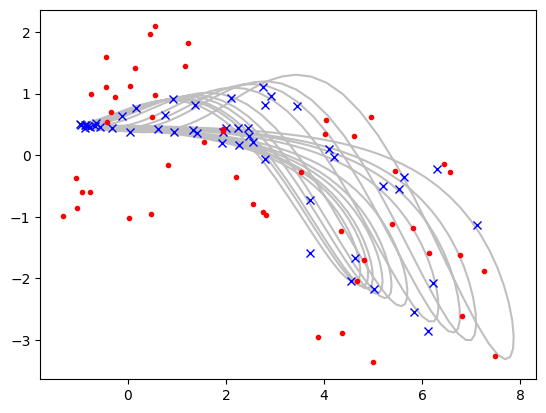

In [100]:
ics_id = model.make_init_conds(50)
ics_ood = model.make_init_conds(50, in_dist=False)
i,j = 0,2
plt.plot(x[:,i], x[:,j], 'k', alpha=0.25)
plt.plot(ics_id[:,i],ics_id[:,j], 'bx')
plt.plot(ics_ood[:,i],ics_ood[:,j], 'r.')

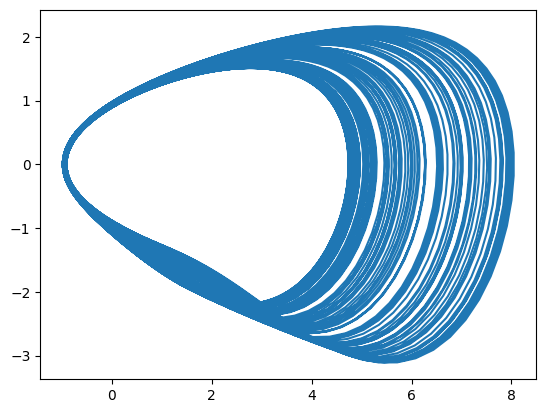

In [21]:
plt.plot(x[:,0], x[:,1])

In [6]:
# plotting in-distribution trajectories
n=100
timesteps = 1000
system = GilpinFlowsSystem(system_name='SprottJerk', pts_per_period=100, seed=42)
system.system.ic = system.make_init_conds(n)
print(system.system.ic.shape)
sol = system.system.make_trajectory(timesteps, method="Radau")
print(sol.shape)
#x = system.system.make_trajectory(x0, timesteps=timesteps)
#plot([x], labels=["X"])

(100, 3)
(69, 1000, 3)


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

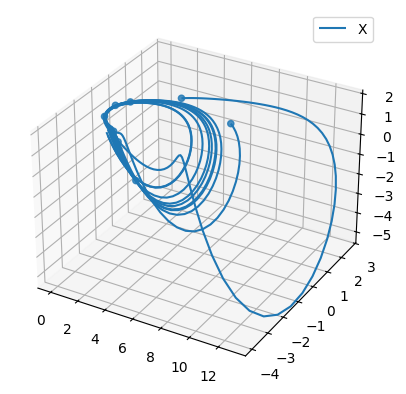

In [7]:
# plotting in-distribution trajectories
n=10
timesteps = 100
system = GilpinFlowsSystem(system_name='SprottJerk', pts_per_period=100, seed=42)
x0 = system.make_init_conds(n)
x = system.make_data(x0, timesteps=timesteps)
plot([x], labels=["X"])

In [110]:
from dysts.utils import generate_ic_ensemble

model = Lorenz()
ics1 = generate_ic_ensemble(model, np.arange(0,2000,10), 5, random_state=42)
model = Lorenz()
ics2 = generate_ic_ensemble(model, np.arange(0,2000,10), 5, random_state=42)

(ics1==ics2).all()

True

(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

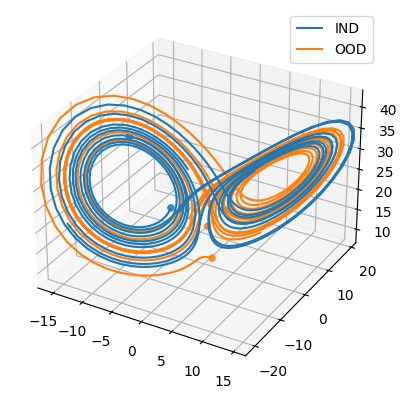

In [9]:
# plotting in-distribution and out-of-distribution trajectories
n = 5
test_size = 3
timesteps = 300
system = SystemChecker(GilpinFlowsSystem(seed=1900))
x0 = system.make_init_conds(n)
y0 = system.make_init_conds(10, in_dist=False)
x = system.make_data(x0, timesteps=timesteps)
y = system.make_data(y0, timesteps=timesteps, noisy=True)
plot([x, y], target_dim=3, labels=["IND", "OOD"], max_lines=test_size)

(5, 1, 3)
(10, 1, 3)


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

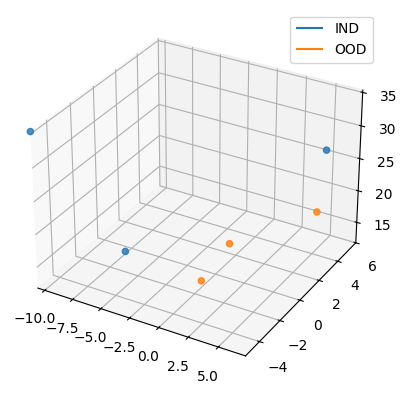

In [36]:
# plotting in-distribution and out-of-distribution initial conditions
import numpy as np

x0_3d = np.expand_dims(x0, axis=1)
y0_3d = np.expand_dims(y0, axis=1)

print(x0_3d.shape)
print(y0_3d.shape)

plot([x0_3d, y0_3d], target_dim=3, labels=["IND", "OOD"], max_lines=test_size)

y_err=54.366857717096835


(<Figure size 640x480 with 1 Axes>, <Axes3D: >)

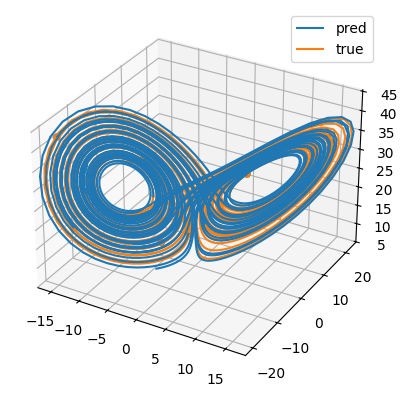

In [26]:
embed_dim = 3
sindy = AlgorithmChecker(SINDy(embed_dim, timesteps, max_control_cost=0, seed=100))
sindy.fit(x)
y_pred = sindy.predict(y[:, 0], timesteps)
y_err = system.calc_error(y, y_pred)
print(f"{y_err=}")
plot([y_pred, y], target_dim=3, labels=["pred", "true"], max_lines=15)

In [7]:
challenge = FixedComplexity(
    N=[10, 50, 100, 500],
    l=3,
    e=3,
    t=50,
    control_horizons=0,
    max_control_cost_per_dim=0,
    system_cls=GilpinFlowsSystem,
    trials=10,
    test_examples=50,
    test_timesteps=50,
    system_kwargs={"system_name": "Lorenz"},
)
data = challenge.evaluate(LinearRegression, id="linear regression")

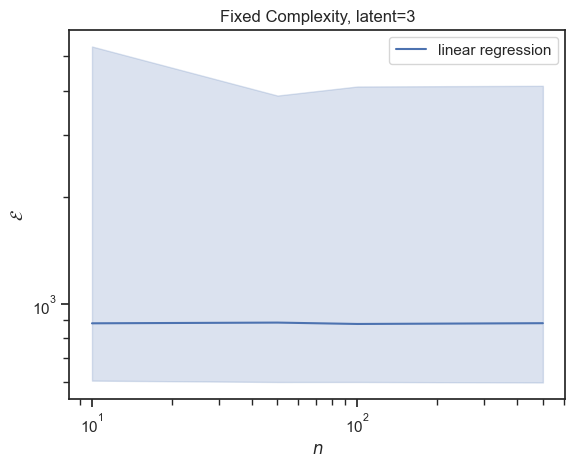

<Axes: title={'center': 'Fixed Complexity, latent=3'}, xlabel='$n$', ylabel='$\\mathcal{E}$'>

In [8]:
challenge.plot(data)

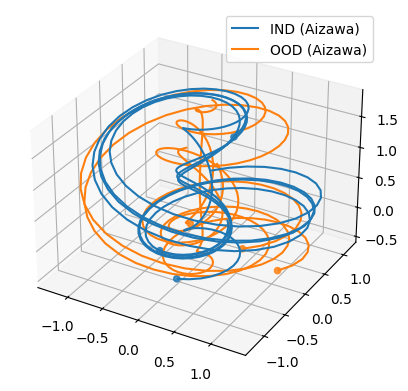

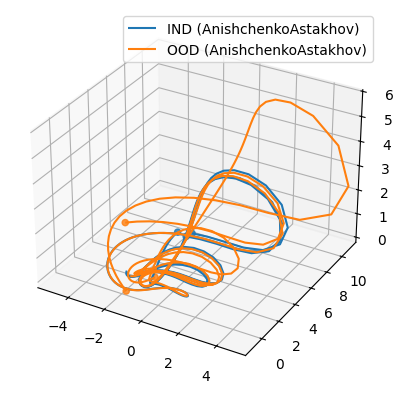

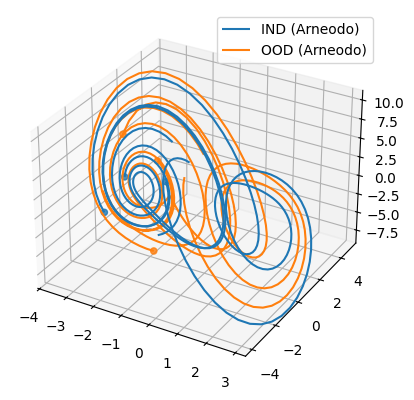

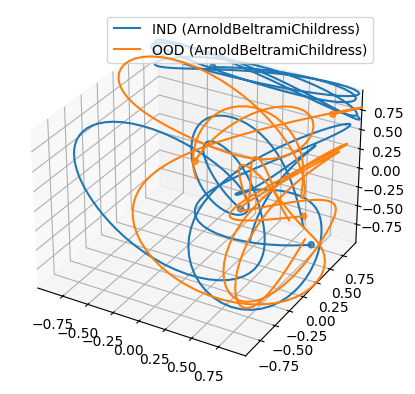

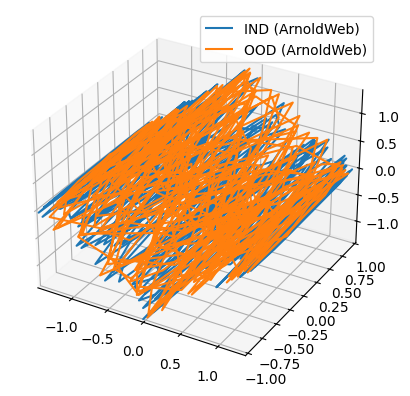

...

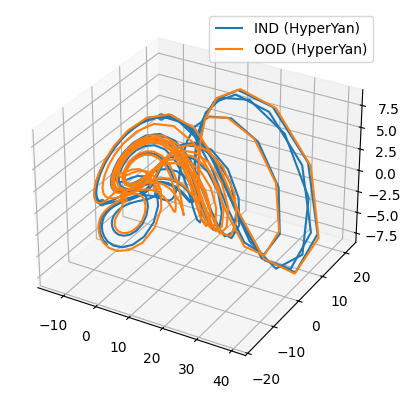

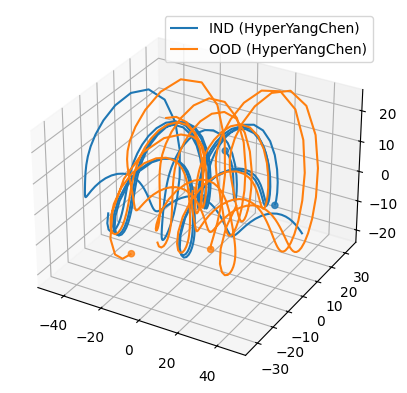

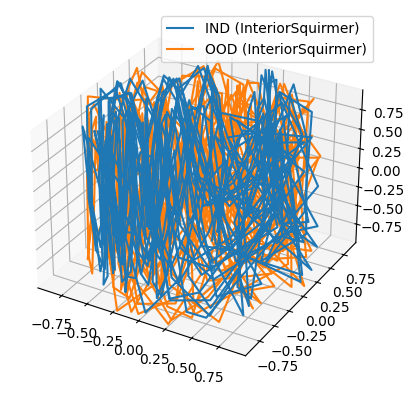

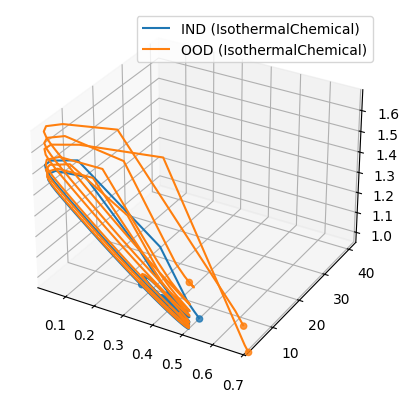

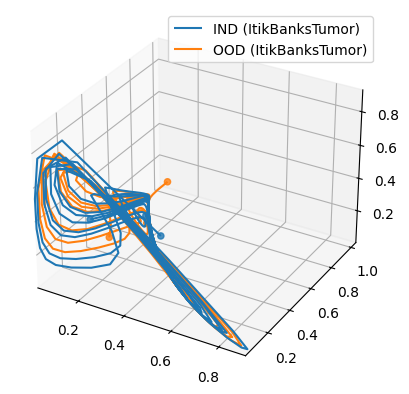

/Users/kanwal/Playground/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:537: RuntimeWarning: overflow encountered in exp
  zdot = -z - x - eps * (np.exp(y / y0) - 1)


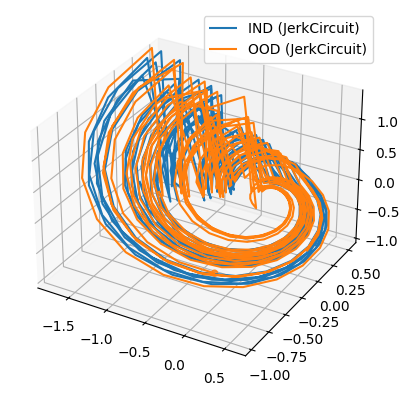

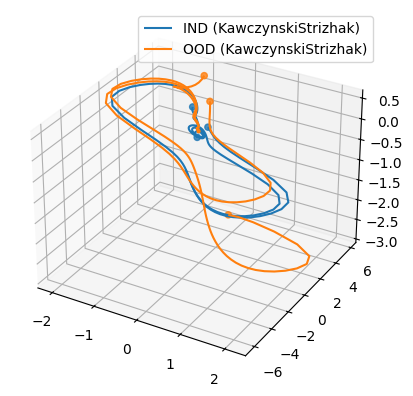

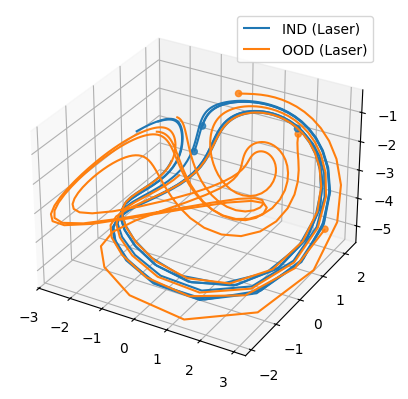

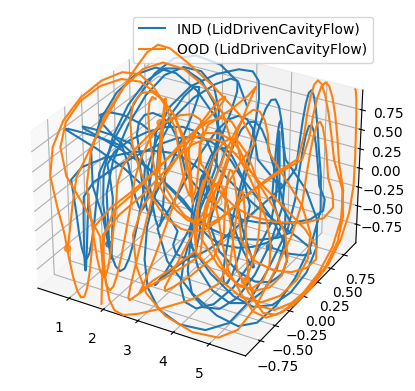

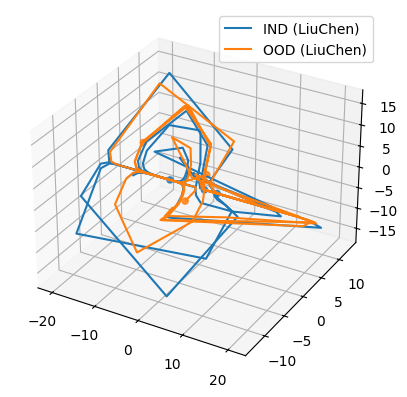

...

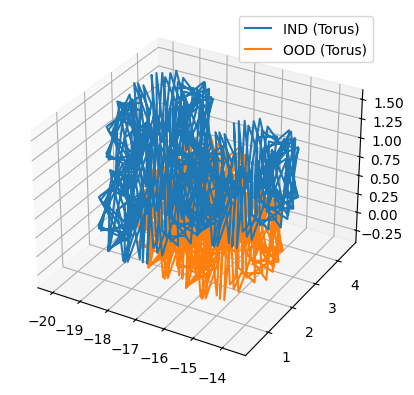

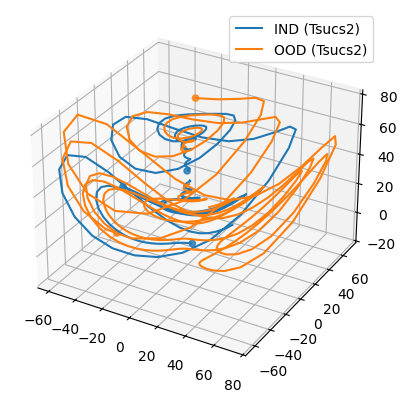

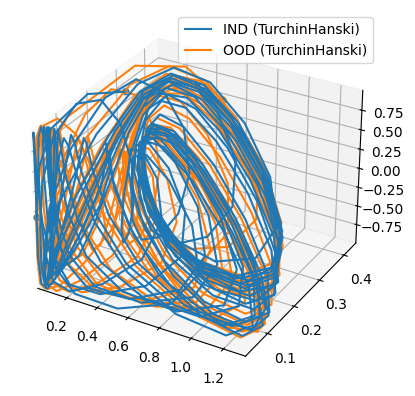

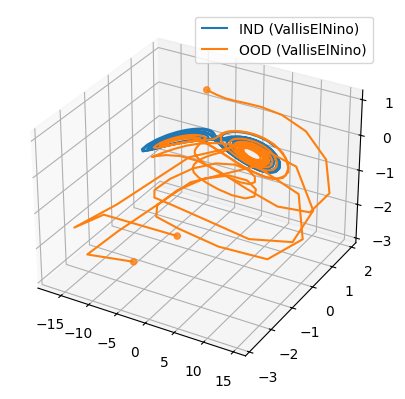

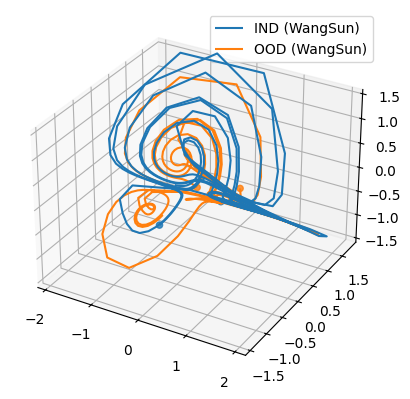

/Users/kanwal/Playground/dynadojo/.venv/lib/python3.10/site-packages/dysts/flows.py:566: RuntimeWarning: invalid value encountered in scalar power
  vsw ** 2 - p ** (5 / 4) * vsw ** (1 / 2) * (1 + np.tanh(d1 * (i - 1))) / 2


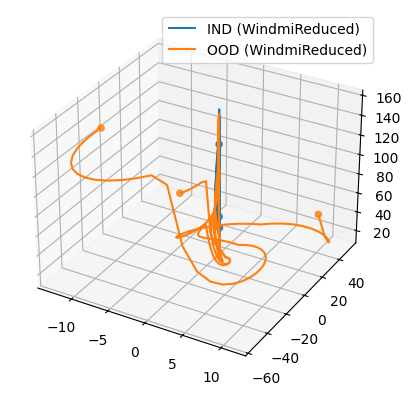

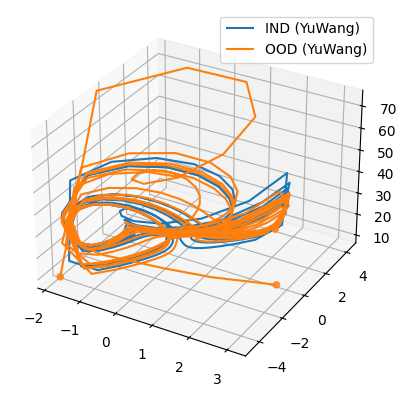

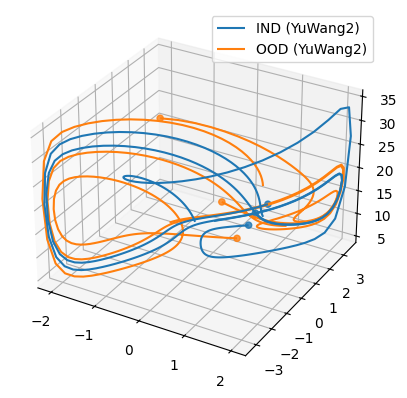

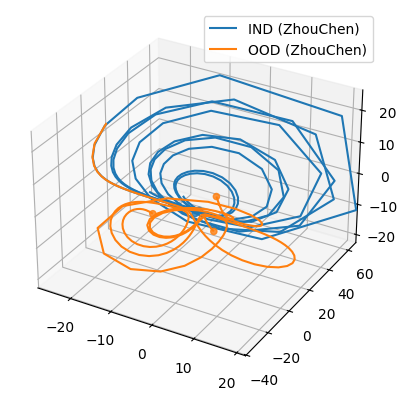

In [10]:
import matplotlib.pyplot as plt
# plot in-distribution and out-of-distribution trajectories for all Gilpin systems
for name in GilpinFlowsSystem.all_systems():
    system = SystemChecker(GilpinFlowsSystem(system_name=name, pts_per_period=50))
    x0 = system.make_init_conds(5)
    y0 = system.make_init_conds(5, in_dist=False)
    x = system.make_data(x0, timesteps=150)
    y = system.make_data(y0, timesteps=150)
    labels = [f"IND ({name})", f"OOD ({name})"]
    plot([x, y], target_dim=3, labels=labels, max_lines=test_size)
    plt.show()